#**Wheat Detection**

---


**Problem Statement:**

Detection of wheat heads is an important task allowing to estimate pertinent traits including head population density and head characteristics such as sanitary state, size, maturity stage and the presence of awns. Several studies developed methods for wheat head detection from high-resolution RGB imagery. They are based on computer vision and machine learning and are generally calibrated and validated on limited datasets. However, variability in observational conditions, genotypic differences, development stages, head orientation represents a challenge in computer vision. Further, possible blurring due to motion or wind and overlap between heads for dense populations make this task even more complex.


**Dataset Description:**

More details on the data acquisition and processes are available at https://arxiv.org/abs/2005.02162


**What should we expect the data format to be?**

The data is images of wheat fields, with bounding boxes for each identified wheat head. Not all images include wheat heads / bounding boxes. The images were recorded in many locations around the world.

The CSV data is simple - the image ID matches up with the filename of a given image, and the width and height of the image are included, along with a bounding box (see below). There is a row in train.csv for each bounding box. Not all images have bounding boxes.




**What am I predicting?**

We are attempting to predict bounding boxes around each wheat head in images that have them. If there are no wheat heads, we must predict no bounding boxes.

In this Notebook we have performed EDA on our dataset and done visualization of wheat heads in images through bounding boxes with the help of obejct detection.


In [ ]:
#importing required libraries 
import os, ast
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from matplotlib import pyplot as plt # plotting
import matplotlib.patches as patches
import seaborn as sns # plotting

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Reading the dataset**

In [ ]:
BASE_DIR = '/content/drive/MyDrive/Wheat-Data'

In [ ]:
%%time
train_df = pd.read_csv(os.path.join(BASE_DIR, 'train.csv'))

CPU times: user 146 ms, sys: 25.3 ms, total: 171 ms
Wall time: 181 ms


In [ ]:
train_df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


Let's see the size of the dataset

In [ ]:
print(f'Shape of training data: {train_df.shape}')

Shape of training data: (147793, 5)


Let's find out number of unique images in training dataset

In [ ]:
print(f'# of unique images: {train_df["image_id"].nunique()}')

# of unique images: 3373


# **Distribution of the size of training images**

In [ ]:
print(f'Unique heights and widths: {train_df["width"].unique()}, {train_df["height"].unique()}')

Unique heights and widths: [1024], [1024]


Min, Max and Average number of wheat heads

In [ ]:
print(f'Minimum number of wheat heads: {max(train_df["image_id"].value_counts())}')
print(f'Minimum number of wheat heads: {len(train_df)/train_df["image_id"].nunique()}')

Minimum number of wheat heads: 116
Minimum number of wheat heads: 43.8164838422769


In [ ]:
print(f'Total number of images: {len(os.listdir(os.path.join(BASE_DIR, "data/train")))}')

Total number of images: 3396


So there are 3396 images in train directory and 3373 images are annotated, that means there are images which do not have any wheat heads in it (without annotation)

Summary of data:

Number of images: 3396

Avg. # of wheat heads per image: ~44

All images have same dimension: 1024 * 1024

Number of minimum bounding boxes (Wheat heads): 0 (Some of the images are without annotation)

Number of maximum bounding boxes (Wheat heads): 116

# **Distribution of number of bounding boxes**

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


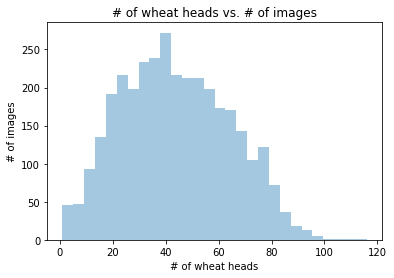

In [ ]:
sns.distplot(train_df['image_id'].value_counts(), kde=False)
plt.xlabel('# of wheat heads')
plt.ylabel('# of images')
plt.title('# of wheat heads vs. # of images')
plt.show()

In [ ]:
# Separating out the coordinates
train_df[['x_min','y_min', 'width', 'height']] = pd.DataFrame([ast.literal_eval(x) for x in train_df.bbox.tolist()], index= train_df.index)
train_df = train_df[['image_id', 'bbox', 'source', 'x_min', 'y_min', 'width', 'height']]
train_df

,image_id,bbox,source,x_min,y_min,width,height
0,b6ab77fd7,"[834.0, 222.0, 56.0, 36.0]",usask_1,834.0,222.0,56.0,36.0
1,b6ab77fd7,"[226.0, 548.0, 130.0, 58.0]",usask_1,226.0,548.0,130.0,58.0
2,b6ab77fd7,"[377.0, 504.0, 74.0, 160.0]",usask_1,377.0,504.0,74.0,160.0
3,b6ab77fd7,"[834.0, 95.0, 109.0, 107.0]",usask_1,834.0,95.0,109.0,107.0
4,b6ab77fd7,"[26.0, 144.0, 124.0, 117.0]",usask_1,26.0,144.0,124.0,117.0
...,...,...,...,...,...,...,...
147788,5e0747034,"[64.0, 619.0, 84.0, 95.0]",arvalis_2,64.0,619.0,84.0,95.0
147789,5e0747034,"[292.0, 549.0, 107.0, 82.0]",arvalis_2,292.0,549.0,107.0,82.0
147790,5e0747034,"[134.0, 228.0, 141.0, 71.0]",arvalis_2,134.0,228.0,141.0,71.0
147791,5e0747034,"[430.0, 13.0, 184.0, 79.0]",arvalis_2,430.0,13.0,184.0,79.0


# **Distribution of size of bounding boxes**

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


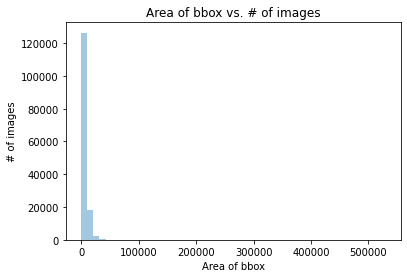

In [ ]:
sns.distplot(train_df['width'] * train_df['height'], kde=False)
plt.xlabel('Area of bbox')
plt.ylabel('# of images')
plt.title('Area of bbox vs. # of images')
plt.show()

# **Visualizing a few training images without bounding**

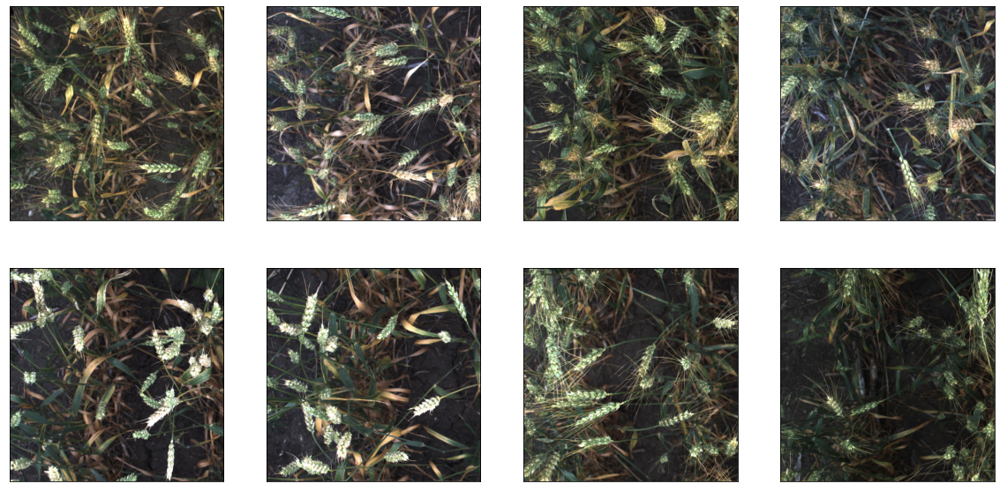

In [ ]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
count=0
for row in ax:
    for col in row:
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", train_df["image_id"].unique()[count])}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1
plt.show()

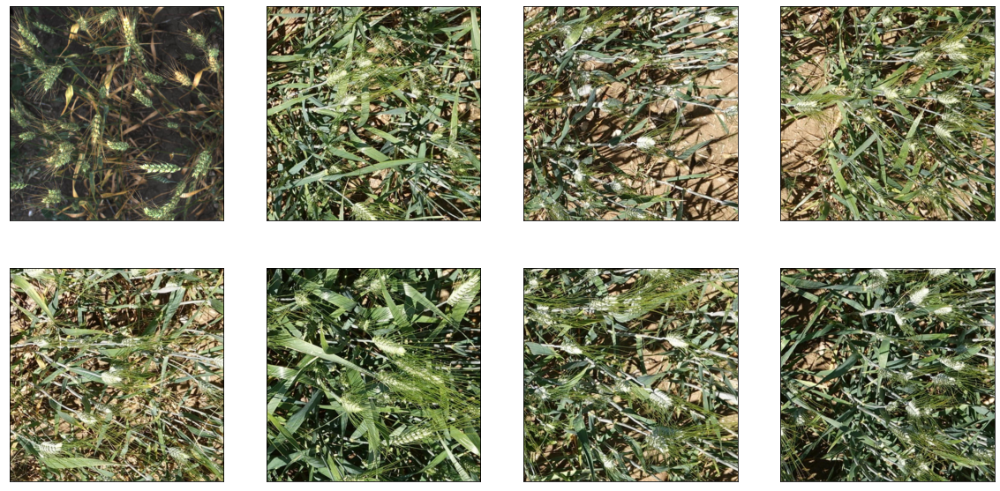

In [ ]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
count=0
for row in ax:
    for col in row:
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", train_df["image_id"].unique()[-count])}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1
plt.show()

# **Now let's visualize a few training images with bounding boxes**

In [ ]:
##bounding box for image_id
def get_bbox(image_id, df, col, color='white'):
    bboxes = df[df['image_id'] == image_id]
    
    for i in range(len(bboxes)):
        # Create a Rectangle patch
        rect = patches.Rectangle(
            (bboxes['x_min'].iloc[i], bboxes['y_min'].iloc[i]),
            bboxes['width'].iloc[i], 
            bboxes['height'].iloc[i], 
            linewidth=2, 
            edgecolor=color, 
            facecolor='none')

        # Add the patch to the Axes
        col.add_patch(rect)

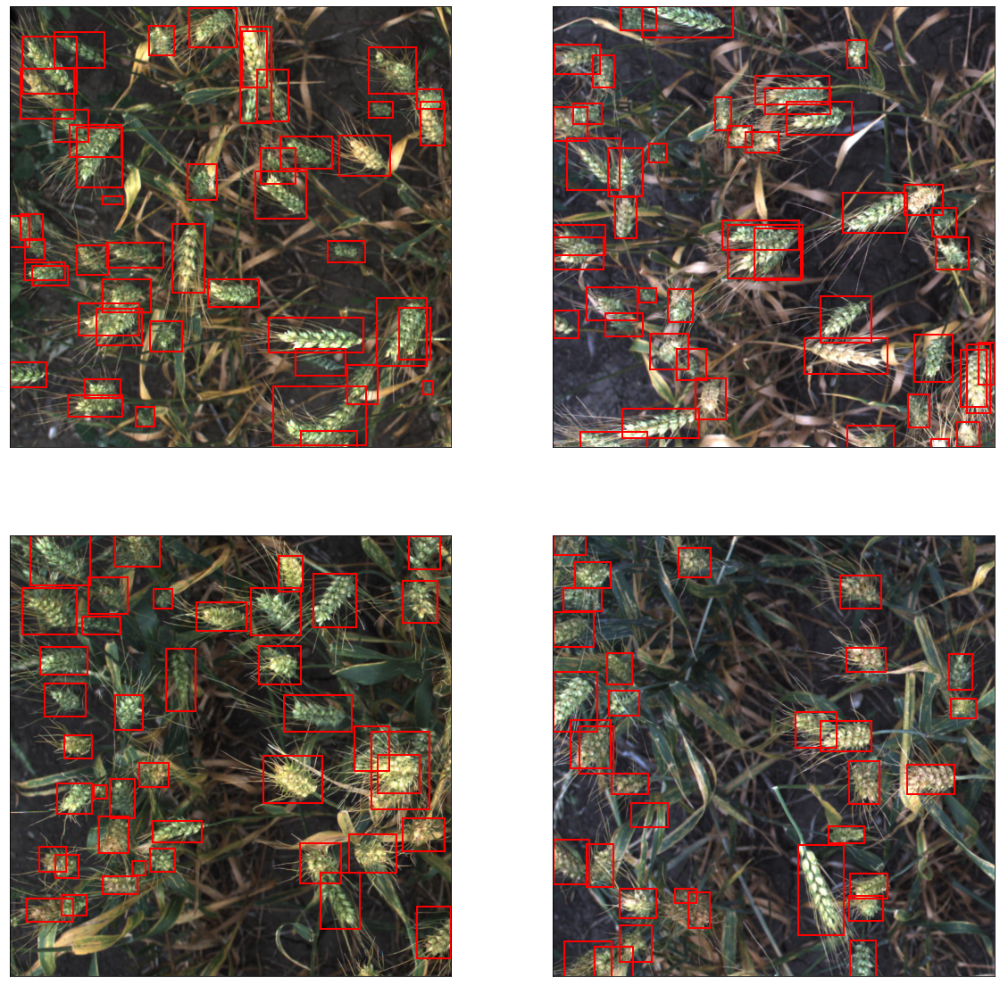

In [ ]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
count=0
for row in ax:
    for col in row:
        img_id = train_df["image_id"].unique()[count]
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        get_bbox(img_id, train_df, col, color='red')
        col.imshow(img)
        count += 1
plt.show()

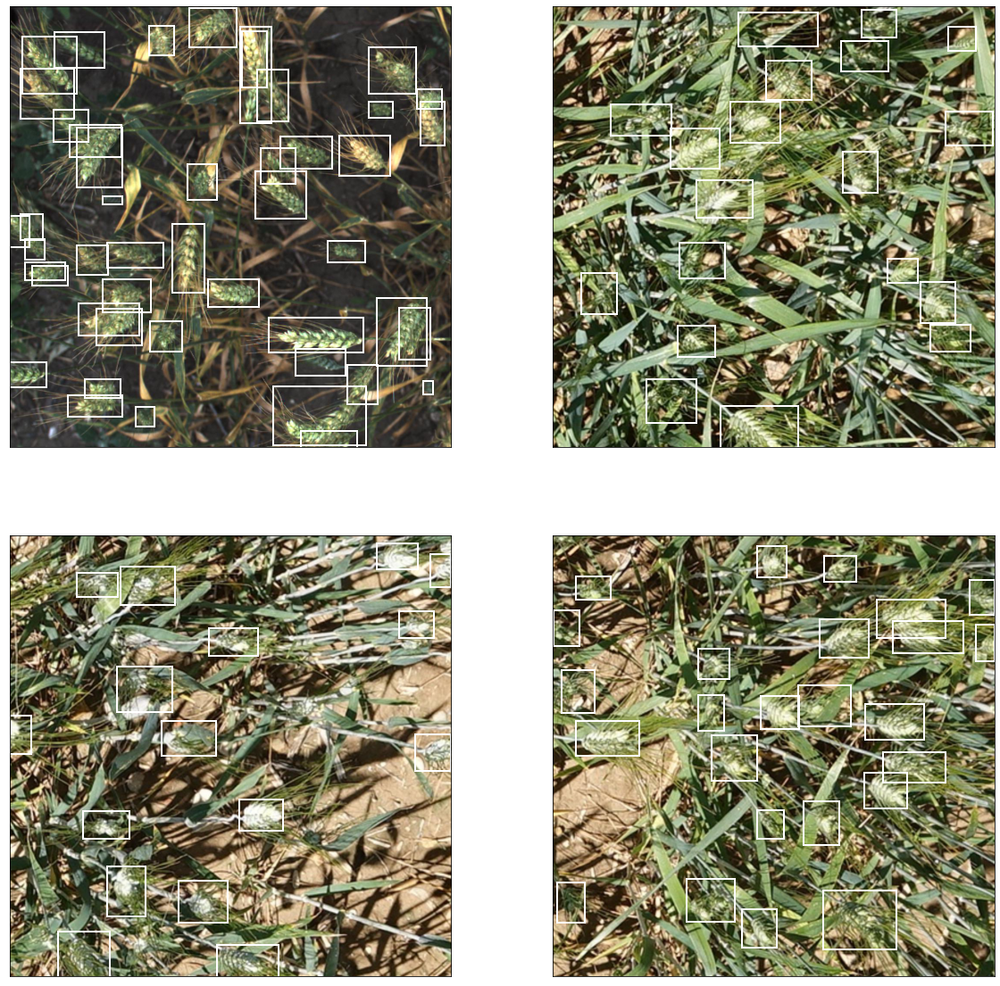

In [ ]:
#few more samples
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
count=0
for row in ax:
    for col in row:
        img_id = train_df["image_id"].unique()[-count]
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        get_bbox(img_id, train_df, col)
        col.imshow(img)
        count += 1
plt.show()

# **Image with highest number of wheat heads**

[]

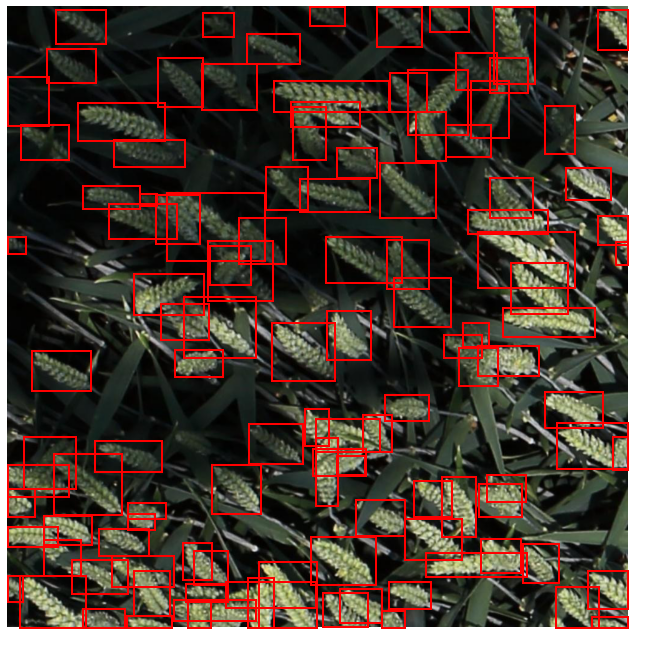

In [ ]:
image_id = (train_df['image_id'].value_counts() == 116).index[0]
img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", image_id)}.jpg')

fig, ax = plt.subplots(1, figsize=(12, 12))

ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')
get_bbox(image_id, train_df, ax, color='red')
ax.imshow(img)
plt.plot()

# **Some of the images without any wheat head**

In [ ]:
all_images = os.listdir(os.path.join(BASE_DIR, 'data/train'))
all_images = set([x[:-4] for x in all_images])

images_with_bbox = set(list(train_df['image_id']))

images_without_bbox = list(all_images - images_with_bbox)

In [ ]:
print(f'Total number of images without wheat heads: {len(images_without_bbox)}')

Total number of images without wheat heads: 48


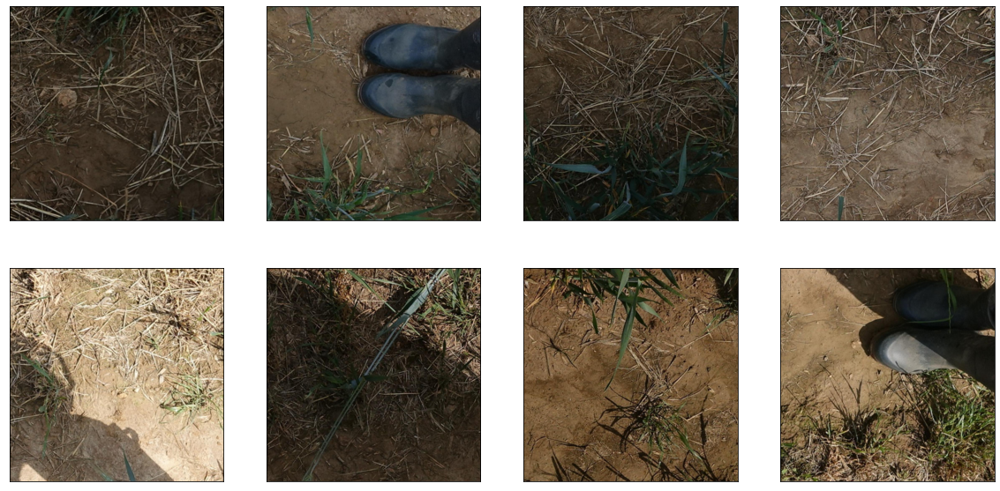

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
count=20
for row in ax:
    for col in row:
        img_id = images_without_bbox[count]
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1
plt.show()

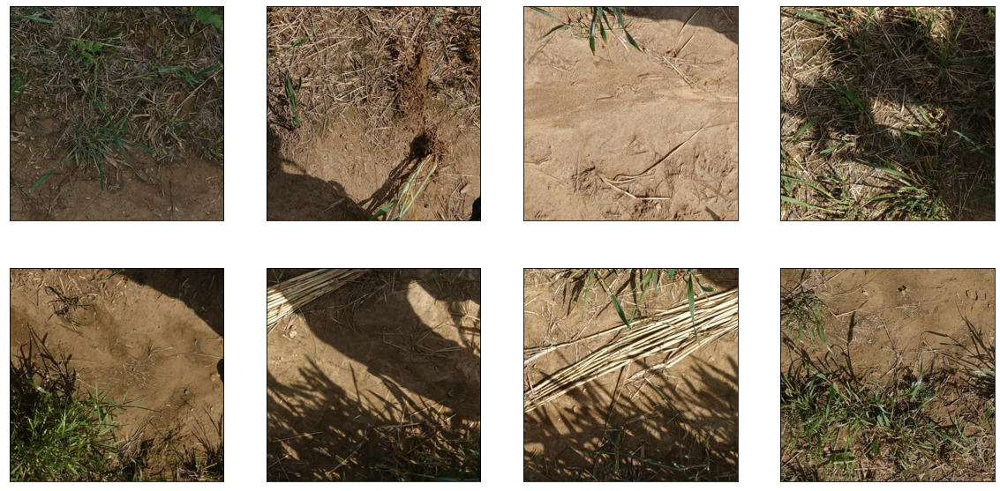

In [ ]:
#Some more samples
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
count = 0
for row in ax:
    for col in row:
        img_id = images_without_bbox[-count]
        img = plt.imread(f'{os.path.join(BASE_DIR, "data/train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1

In [ ]:
# Serialize `train_df` to a .csv file
train_df.to_csv(os.path.join(BASE_DIR, 'train_df.csv'), index=False)